<a href="https://colab.research.google.com/github/naveenkumarch/Forest_Fire_Image_Classification/blob/main/code/F_fire_Img_analysis_segmentation.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#                   **<font color='blue'>Forest Fire Detection using Image classification</font>**

---







In [13]:
#mounting google drive for Data 
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [32]:
import os
# Function used for creating and unziping data directiories in Drive
os.chdir('/content/drive/MyDrive/Colab Notebooks')  #change dir
#!mkdir train  #create a directory named train/
#!mkdir test  #create a directory named test/
#!unzip -q Training.zip -d train/  #unzip data in train/
#!unzip -q Test.zip -d test/  #unzip data in test/

In [33]:
# Importing Basic libraries for Analysis and Data Visualization
import matplotlib.pyplot as plt
import numpy as np
import cv2
import os
import PIL
import tensorflow as tf
import seaborn as sns 

#Importing kerad library from Tesnorflow for Deep CNN models. 
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential


In [ ]:
# Suppressing Warnings
import warnings
warnings.filterwarnings('ignore')

# **Data Loading**

In [34]:
# Creating a Dictonary containg directories of the Train images
Fire_Train_images_dict = {
    'Fire' : "/content/drive/MyDrive/Colab Notebooks/train/Training/Fire",
    'No_fire' : "/content/drive/MyDrive/Colab Notebooks/train/Training/No_Fire"
}

In [35]:
# Creating a dictonary containing enumerated values for the labels of the Data
Fire_labels_dict = {
    'Fire' : 0,
    'No_fire':1
}

In [36]:
# Reading images from the data using OpenCV library for having better data manipulation capability.
X= []       # Varaible for Containg Images
y = []      # Variable for containg Labels of Images
for dirs,values in Fire_Train_images_dict.items():
    #print(str(dirs))
    print(values)
    #os.walk function returns three outputs in following sequence root directory,Sub directories & individual files names in all directories.
    for dirname, _, filenames in os.walk(values):
        #print(len(filenames))
        for filename in filenames:
            #print(filename)
            X.append(cv2.imread(str(values+'/'+filename)))
            #imread function loads image in BGR format by default instead of RGB format. 
            y.append(Fire_labels_dict[str(dirs)])
            # Assining the respective image a label based on which directory it is present 

/content/drive/MyDrive/Colab Notebooks/train/Training/Fire
/content/drive/MyDrive/Colab Notebooks/train/Training/No_Fire


In [83]:
# Creating a Dictonary containg directories of the Test images
Fire_Test_images_dict = {
    'Fire' : "/content/drive/MyDrive/Colab Notebooks/test/Test/Fire",
    'No_fire' : "/content/drive/MyDrive/Colab Notebooks/test/Test/No_Fire"
}

In [87]:
# Reading images from the data using OpenCV library
X_test= []       # Variable for Containg Images
y_test = []      # Variable for Labels of Images
for dirs,values in Fire_Test_images_dict.items():
    #print(str(dirs))
    print(values)
    #os.walk function returns three outputs in following sequence root directory,Sub directories & individual files names in all directories.
    for dirname, _, filenames in os.walk(values):
        #print(len(filenames))
        for filename in filenames:
            #print(filename)
            #imread function loads image in BGR format by default instead of RGB format.
            X_test.append(cv2.imread(str(values+'/'+filename)))
            y_test.append(Fire_labels_dict[str(dirs)])
            # Assining the respective image a label based on which directory it is present

/content/drive/MyDrive/Colab Notebooks/test/Test/Fire
/content/drive/MyDrive/Colab Notebooks/test/Test/No_Fire


# **Data Analysis & Visualization**

Analysing Data Distributions between Testing and Training sets and also class density/ Distribution in training data. Visulaing Images belonging to different Labels.Conversion of images from one colour space to another colour space and Histogram calculation for images belongigng to different classes.    

In [64]:
# Observing total no of samples present in both Training and Test sets
print("Number of Training Images is : ",len(X))
print("Number of Test Images is : ",len(X_test))

Number of Training Images is :  39375
Number of Test Images is :  8617


In [38]:
# Individual Image Pixel resolution and no of colour spaces being used.
print("Image size and colour space", np.shape(X[0]))

Image size and colour space (254, 254, 3)


.**From the above result each Image is of 254*254 rosultion and is a colour image**

Text(0.5, 0, 'Class Labels')

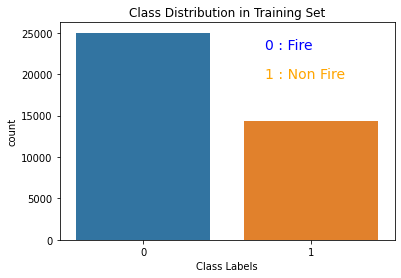

In [39]:
# Plotting distribution of different classes in the training data 
plt.subplot(1,1,1)
sns.countplot(y)
plt.title("Class Distribution in Training Set")
# Adding Coustom legend since class labels are enumarted beforhand
plt.figtext(0.6, 0.8, 
            "0 : Fire", 
            horizontalalignment ="left",  
            verticalalignment ="center",  
            wrap = True, fontsize = 14,  
            color ="blue")
plt.figtext(0.6, 0.7, 
            "1 : Non Fire", 
            horizontalalignment ="left",  
            verticalalignment ="center",  
            wrap = True, fontsize = 14,  
            color ="orange")
plt.xlabel("Class Labels")

**From the above histogram the data set contains more no of smaples for Fire Label than it did for non fire images. So its a bit unbalanced Data set**

Text(0.5, 0, 'Class Labels')

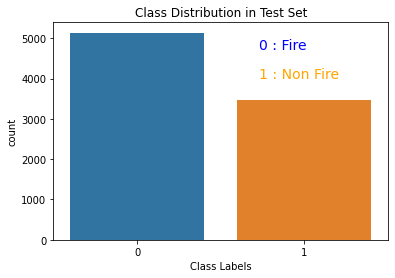

In [40]:
# Plotting distribution of different classes in the test data 
plt.subplot(1,1,1)
fig = sns.countplot(y_test)
plt.title("Class Distribution in Test Set")
# Adding Coustom legend since class labels are enumarted beforhand
plt.figtext(0.6, 0.8, 
            "0 : Fire", 
            horizontalalignment ="left",  
            verticalalignment ="center",  
            wrap = True, fontsize = 14,  
            color ="blue")
plt.figtext(0.6, 0.7, 
            "1 : Non Fire", 
            horizontalalignment ="left",  
            verticalalignment ="center",  
            wrap = True, fontsize = 14,  
            color ="orange")
plt.xlabel("Class Labels")

**The Data distribution is almost similar in Test Data as well**

In [41]:
# Conversting labels list varaible into Numpy array for ease of performing analysis.
y = np.array(y)
# Determing indexs in Training data where Non Fire images are present.
Train_NF_labels = np.where(y == 1)
print("No of train samples for Non fire images", len(Train_NF_labels[0]))
# Determing indexs in Training data where Fire images are present.
Train_F_labels = np.where(y == 0)
print("No of test samples for fire images",len(Train_F_labels[0]))

No of train samples for Non fire images 14357
No of test samples for fire images 25018


In [42]:
# Selecting 9 Non fire image samples at random
idx = np.random.choice(len(Train_NF_labels[0]), size=9, replace=False)

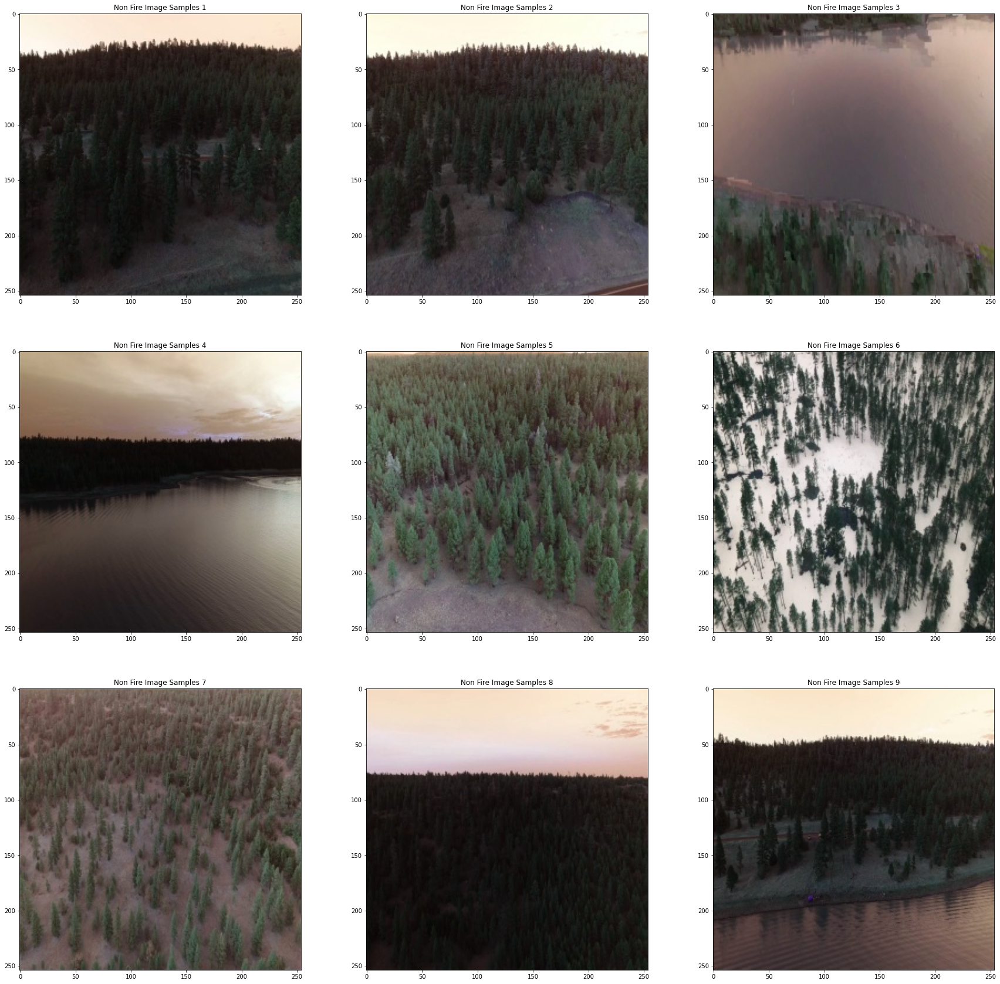

In [65]:
# Visualizing Non Fire Images
plt.subplots(3,3,figsize= (30,30))
for i in range(len(idx)):
    plt.subplot(3,3,(i+1))
    plt.title("Non Fire Image Samples "+ str(i+1))
    plt.imshow(X[Train_NF_labels[0][idx[i]]])

**From above observations there is variabilty in the environemnt and background of non fire images**

In [44]:
# Selecting 9 fire image samples at random
idx2 = np.random.choice(len(Train_F_labels[0]), size=9, replace=False)

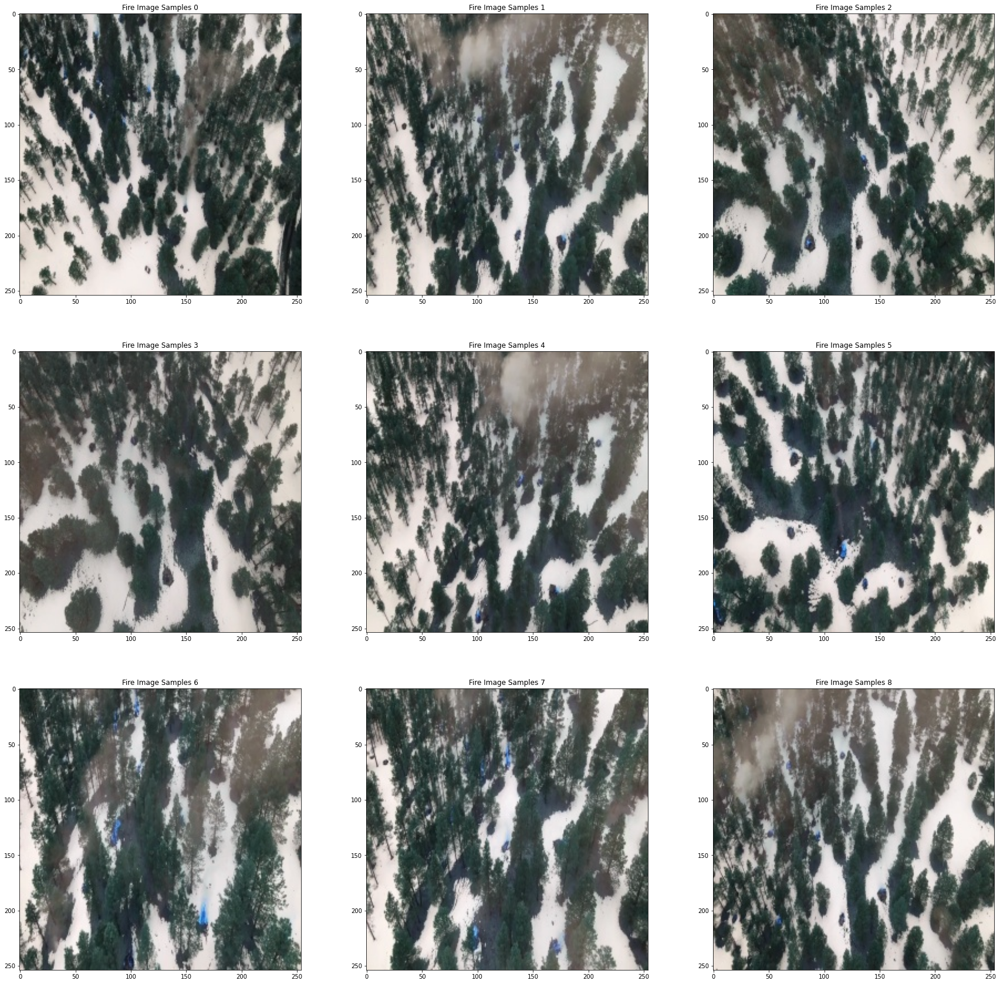

In [45]:
# Visualizing 9 samples from Fire Images class
plt.subplots(3,3,figsize= (30,30))
for i in range(len(idx2)):
    plt.subplot(3,3,i+1)
    plt.title("Fire Image Samples "+ str(i))
    plt.imshow(X[Train_F_labels[0][idx2[i]]])

**From the above images there is no variability in the lighting conditins and background of Fire CLass images. This is because of the images belong to a single video captured from a UAV. Because of this Data Augmentation becomes critical for atleast the fire images class for better generalization of the Trained Model**

In [88]:
# Conversting labels list varaible into Numpy array for ease of performing analysis.
y_test = np.array(y_test)
# Determing indexs in Training data where Non Fire images are present.
Test_NF_labels = np.where(y_test == 1)
# Determing indexs in Training data where Fire images are present.
Test_F_labels = np.where(y_test == 0)
print("No of test samples for Non fire images", len(Test_NF_labels[0]))
print("No of test samples for fire images", len(Test_F_labels[0]))

No of test samples for Non fire images 3480
No of test samples for fire images 5137


In [89]:
# Selecting 4 Non fire image samples at random
idx3 = np.random.choice(len(Test_NF_labels[0]), size=4, replace=False)

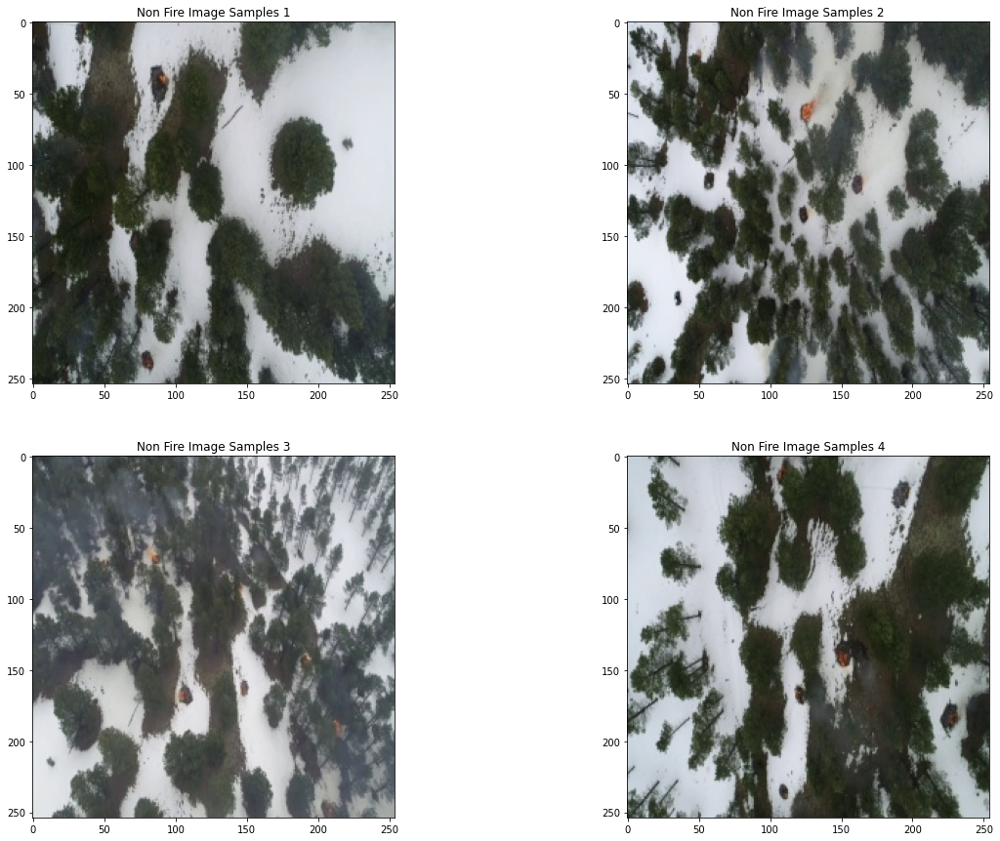

In [90]:
# Visualizing Non Fire Images
plt.subplots(2,2,figsize= (20,15))
for i in range(len(idx3)):
    plt.subplot(2,2,(i+1))
    plt.title("Non Fire Image Samples "+ str(i+1))
    temp = cv2.cvtColor(X[Test_NF_labels[0][idx3[i]]], cv2.COLOR_BGR2RGB)
    plt.imshow(temp)

In [85]:
# Selecting 4 fire image samples at random
idx4 = np.random.choice(len(Test_F_labels[0]), size=4, replace=False)

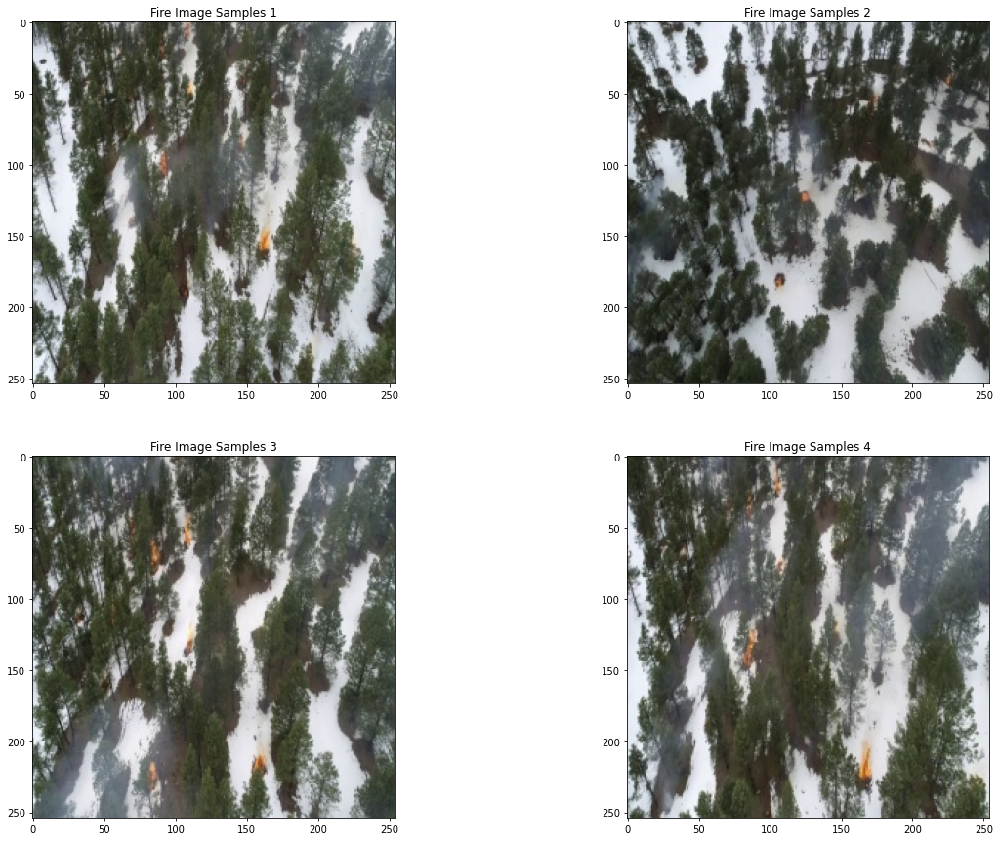

In [91]:
# Visualizing Non Fire Images
plt.subplots(2,2,figsize= (20,15))
for i in range(len(idx4)):
    plt.subplot(2,2,(i+1))
    plt.title("Fire Image Samples "+ str(i+1))
    temp = cv2.cvtColor(X[Test_F_labels[0][idx4[i]]], cv2.COLOR_BGR2RGB)
    plt.imshow(temp)

**The Testing data same environment as the Training Fire Class data. A simple CNN Model trained using this Data without any data Preprocessing has a higher chance of attracting more False positives. There is also lot of noise in the data interms of incorrect labeling done in both Train and Test sets**

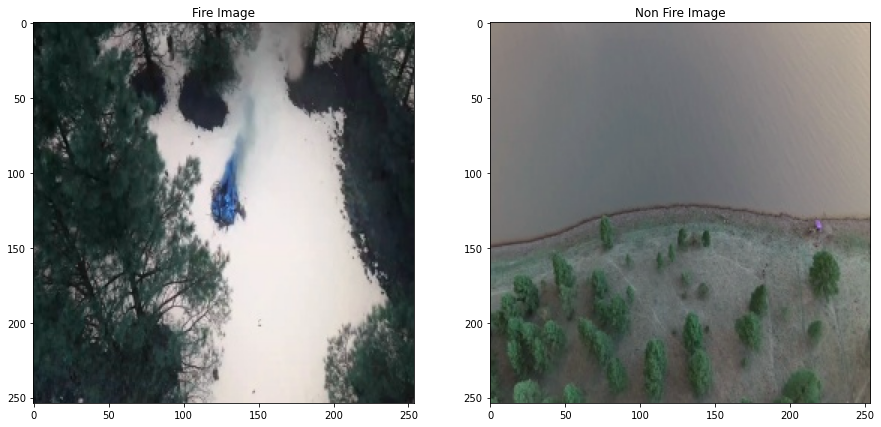

In [66]:
# Reading a Image file from the fire class label 
fire_image = cv2.imread("/content/drive/MyDrive/Colab Notebooks/train/Training/Fire/resized_frame0.jpg")
#Plotting the read image
plt.subplots(1,2,figsize=(15,8))
plt.subplot(1,2,1)
plt.title("Fire Image")
plt.imshow(fire_image)
# Reading a Image file from the non fire class label
non_fire_image = cv2.imread("/content/drive/MyDrive/Colab Notebooks/train/Training/No_Fire/lake_resized_lake_frame0.jpg")
#Plotting the read image
plt.subplot(1,2,2)
plt.title("Non Fire Image")
plt.imshow(non_fire_image)

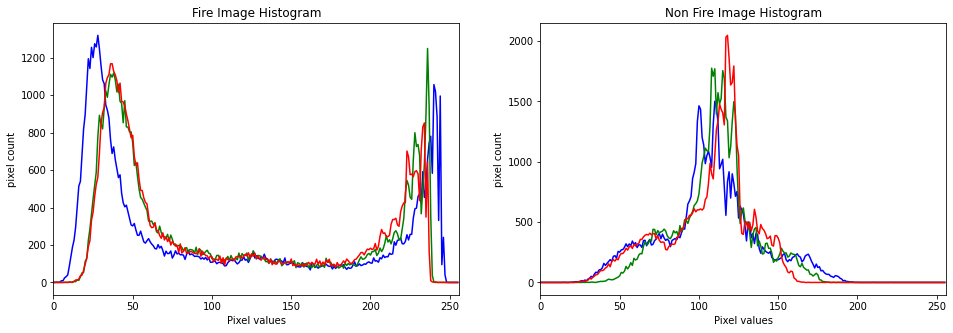

In [50]:
color = ('b','g','r')
plt.subplots(1,2,figsize=(16,5))
# Calculating colour wise histograms for the above read images using CalcHist function from OpenCV and Plotting 
for i,col in enumerate(color):
    histr = cv2.calcHist([fire_image],[i],None,[256],[0,256])
    plt.subplot(1,2,1)
    plt.plot(histr,color = col)
    plt.title("Fire Image Histogram")
    plt.xlabel("Pixel values")
    plt.ylabel("pixel count")
    plt.xlim([0,256])
for i,col in enumerate(color):
    histr = cv2.calcHist([non_fire_image],[i],None,[256],[0,256])
    plt.subplot(1,2,2)
    plt.plot(histr,color = col)
    plt.title("Non Fire Image Histogram")
    plt.xlabel("Pixel values")
    plt.ylabel("pixel count")
    plt.xlim([0,256])
plt.show()

****

**1.   Because the background of the fire image is filled with tress along with trees in the middle the green pixel value is higher in the fire image than Red pixel values.**









**2.   The non fire image is mostlhy filled with ice and water so the pixel values more concentrated in the middle for each channel indicating no colour have dominance**



In [51]:
# Printing the max and min pixel values of the fire image in all three colour bands. 
print("The max and min pixel values of the fire image is %d & %d" %(np.max(fire_image),np.min(fire_image)) )
# Printing the max and min pixel values of the fire image in only red colour bands. 
print("The max and min pixel values of the fire image in red colour domain is %d & %d" %(np.max(fire_image[:,:,2]),np.min(fire_image[:,:,2])) )

The max and min pixel values of the fire image is 248 & 0
The max and min pixel values of the fire image in red colour domain is 246 & 7


In [52]:
# Printing the max and min pixel values of the non fire image in all three colour bands.
print("The max and min pixel values of the non fire image is %d & %d" %(np.max(non_fire_image),np.min(non_fire_image)) )
# Printing the max and min pixel values of the non fire image in only red colour bands.
print("The max and min pixel values of the non fire image in red colour domain is %d & %d" %(np.max(non_fire_image[:,:,2]),np.min(non_fire_image[:,:,2])) )

The max and min pixel values of the non fire image is 221 & 15
The max and min pixel values of the non fire image in red colour domain is 221 & 19


#**Colour Space based Segmentation**

In [92]:
def fire_Segmentation(img):
    # converting image from RGB colour space into ycbcbr colour space
    ybr = cv2.cvtColor(img, cv2.COLOR_BGR2YCrCb)
    # calculating the shape of the orgical image
    ny, nx, nc = img.shape
    # claculating mean values of the main Y, Cb and Cr regions of the colour space
    ymean  = ybr[:,:,0].mean()
    cbmean = ybr[:,:,1].mean()
    crmean = ybr[:,:,2].mean()
    P_count = 0
    # Intializing all rule values to zero
    rules = np.zeros(4)
    # defingig Red,Green and Blue dimension values
    blue_reg = 0
    green_reg = 1
    red_reg = 2
    # defing Y, Cb and Cr dimenation values
    y_reg = 0
    cr_reg = 1
    cb_reg = 2
    #Creating a temp zeros array for storing the binary fire segment image
    temp_fire_seg = np.zeros((ny,nx,3))
    for y in range(ny):
        for x in range(nx):
            # First Rule : pixel values in the Reg region > pixel values in green region > pixel values in blue region
            if (img[y,x,blue_reg] < img[y,x,green_reg] and img[y,x,green_reg] < img[y,x,red_reg]):
                rules[0] = 1
            else: 
                rules[0] = 0
            # Second Rule : The luma Component(lumination) value of that region should be >= Blue chroma component
            if ybr[y,x,y_reg] >= ybr[y,x,cb_reg]:
                rules[1] = 1
            else:
                rules[1] = 0
            # Third Rule : The Red chroma component of the region should be >= Blue chroma component
            if ybr[y,x,cr_reg] >= ybr[y,x,cb_reg]:
                rules[2] = 1
            else:
                rules[2] = 0
            # Rule 4 : The lumination of that region should be greater than the average lumination of the entire image and blue chroma component should be less than mean value of entire image mean blue chroma vaue
            # The Red chroma component of that region should be greater than the over all mean read chroma component 
            if (ybr[y,x,y_reg] >= ymean and ybr[y,x,cb_reg] <= cbmean and ybr[y,x,cr_reg] >= crmean):
                rules[3] = 1
            else:
                rules[3] = 0
            # Verifing all 4 rules have been met by the regiona. if meet then tagging it as a suspected fire region.
            if np.sum(rules) == 4:
                P_count += 1 
                temp_fire_seg[y,x,:] = 1
            else:
                continue
    # Returning the binarised segmented image and no of such regions(pixel locations) found in the image 
    return temp_fire_seg, P_count

In [61]:
# Selecting 250 Non fire image samples at random
idnf = np.random.choice(len(Train_NF_labels[0]), size=250, replace=False)
# Selecting 250 fire image samples at random
idf = np.random.choice(len(Train_F_labels[0]), size=250, replace=False)

In [96]:
# 250 randomly selected Non Fire class images are segmented and recording image index for images where susupected regions are found.
No_of_imgs_sus_f = 0
pos = [] 
for i in range(len(idnf)):
    _, f_pix_count = fire_Segmentation(X[Train_NF_labels[0][idnf[i]]])
    if i%50 == 0:
        print("Processed %d images"%(i))
    if f_pix_count > 0:
        No_of_imgs_sus_f += 1
        pos.append(idnf[i])
print("Out of 250 Non fire images suspected flame region found in %d"%(No_of_imgs_sus_f))   

Processed 0 images
Processed 50 images
Processed 100 images
Processed 150 images
Processed 200 images
Out of 250 Non fire images suspected flame region found in 63


In [62]:
# 250 randomly selected Fire class images are segmented and recording image index for regions images where suspected regions not found.
No_of_imgs_sus_nf = 0
pos2 = []
for i in range(len(idf)):
    _, f_pix_count = fire_Segmentation(X[Train_F_labels[0][idf[i]]])
    if i%50 == 0:
        print("Processed %d images"%(i))
    if f_pix_count == 0:
        No_of_imgs_sus_nf += 1
        pos2.append(idf[i])
print("Out of 250 fire images suspected flame region not found in %d"%(No_of_imgs_sus_nf))

Processed 0 images
Processed 50 images
Processed 100 images
Processed 150 images
Processed 200 images
Out of 250 fire images suspected flame region not found in 1


In [58]:
# Selecting 9 Non fire image samples at random
idnf = np.random.choice(len(Train_NF_labels[0]), size=250, replace=False)
# Selecting 9 fire image samples at random
idf = np.random.choice(len(Train_F_labels[0]), size=250, replace=False)


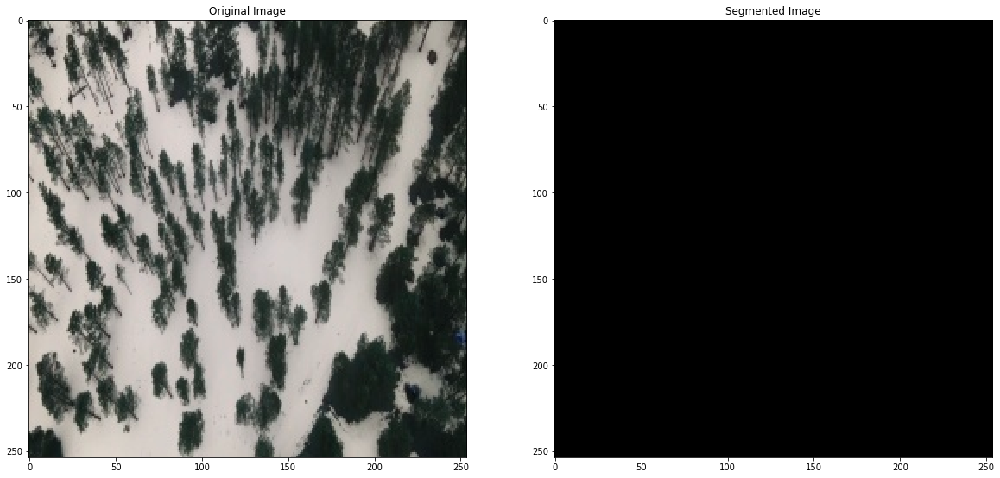

In [93]:
# Using the above observed images visualing the original image and also segmented image.
temp_images = []
plt.subplots(len(pos2),2,figsize= (20,30))
for i in range(len(pos2)):
    temp_img , temp_pixels = fire_Segmentation(X[Train_F_labels[0][pos2[i]]])
    plt.subplot(len(pos2),2,(i*2+1))
    plt.imshow(X[Train_F_labels[0][pos2[i]]])
    plt.title("Original Image")
    plt.subplot(len(pos2),2,(i*2+2))
    plt.imshow(temp_img)
    plt.title("Segmented Image")

**As you can observe in the top image. Even though no visible fire region is present in it . It was wrongly labeled as a Fire class image. Since the indexs are randomly chossen every time.The chances of getting a wrongly labeled image is not 100%. I was able to observe 4-5 such wrongly labled images in previous runs and included those snips in results. Further investigation is nedded on such wrongly labeled images. Even Test contain to some extent wrong labels**

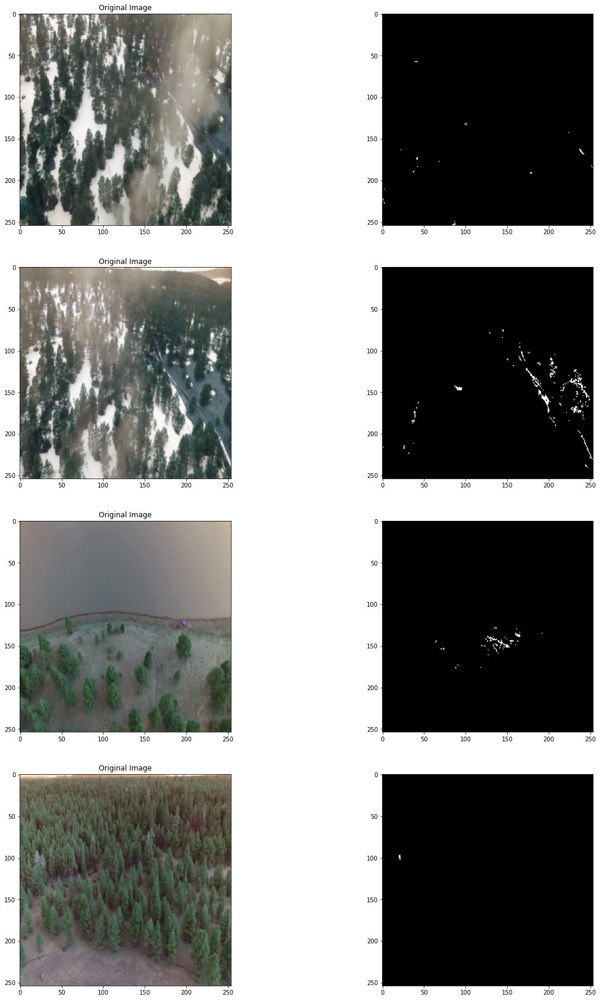

In [95]:
plt.subplots(4,2,figsize=(20,30))
for i in range(4):
    temp_img , temp_pixels = fire_Segmentation(X[Train_NF_labels[0][pos[i]]])
    plt.subplot(4,2,((i)*2+1))
    plt.imshow(X[Train_NF_labels[0][pos[i]]])
    plt.title("Original Image")
    plt.subplot(4,2,((i)*2+2))
    plt.imshow(temp_img)

**From above Observations.Some shadows and evening/mornign skies during sun set and raise is being detected as susupected flame regions. more good snips are added in report. This is an expected behaviour since only information is used for segmentation and using CNN to learnt he difference between and such regions will be worked upon for the final submission**